## **Extreme Weather Events: Advanced Analysis**

**Abstract:**  
This project analyzes extreme weather events using advanced statistical and computational methods. Key trends and patterns are highlighted through clear visualizations and side-by-side comparisons.

**Methods:**  
- Statistical analysis of extreme weather datasets  
- Side-by-side visualizations for comparison  
- Advanced techniques
- Bias in data has been considered where relevant

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
storms = pd.read_csv(
    r"D:\Ruchi\ibtracs.ALL.list.v04r01.csv",
    low_memory=False
)
storms.head()

,SID,SEASON,NUMBER,BASIN,SUBBASIN,NAME,ISO_TIME,NATURE,LAT,LON,...,BOM_GUST_PER,REUNION_GUST,REUNION_GUST_PER,USA_SEAHGT,USA_SEARAD_NE,USA_SEARAD_SE,USA_SEARAD_SW,USA_SEARAD_NW,STORM_SPEED,STORM_DIR
0,,Year,,,,,,,degrees_north,degrees_east,...,second,kts,second,ft,nmile,nmile,nmile,nmile,kts,degrees
1,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 03:00:00,NR,10.9,80.3,...,,,,,,,,,9,265
2,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 06:00:00,NR,10.9,79.8,...,,,,,,,,,9,265
3,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 09:00:00,NR,10.8,79.4,...,,,,,,,,,9,265
4,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 12:00:00,NR,10.8,78.9,...,,,,,,,,,9,265


In [3]:
print(storms.shape)
print(storms.columns)

(722895, 174)
Index(['SID', 'SEASON', 'NUMBER', 'BASIN', 'SUBBASIN', 'NAME', 'ISO_TIME',
       'NATURE', 'LAT', 'LON',
       ...
       'BOM_GUST_PER', 'REUNION_GUST', 'REUNION_GUST_PER', 'USA_SEAHGT',
       'USA_SEARAD_NE', 'USA_SEARAD_SE', 'USA_SEARAD_SW', 'USA_SEARAD_NW',
       'STORM_SPEED', 'STORM_DIR'],
      dtype='object', length=174)


In [4]:
storms.head(10)

,SID,SEASON,NUMBER,BASIN,SUBBASIN,NAME,ISO_TIME,NATURE,LAT,LON,...,BOM_GUST_PER,REUNION_GUST,REUNION_GUST_PER,USA_SEAHGT,USA_SEARAD_NE,USA_SEARAD_SE,USA_SEARAD_SW,USA_SEARAD_NW,STORM_SPEED,STORM_DIR
0,,Year,,,,,,,degrees_north,degrees_east,...,second,kts,second,ft,nmile,nmile,nmile,nmile,kts,degrees
1,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 03:00:00,NR,10.9,80.3,...,,,,,,,,,9,265
2,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 06:00:00,NR,10.9,79.8,...,,,,,,,,,9,265
3,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 09:00:00,NR,10.8,79.4,...,,,,,,,,,9,265
4,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 12:00:00,NR,10.8,78.9,...,,,,,,,,,9,265
5,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 15:00:00,NR,10.8,78.4,...,,,,,,,,,9,270
6,1842298N11080,1842,1,NI,AS,UNNAMED,1842-10-25 18:00:00,NR,10.8,77.9,...,,,,,,,,,10,270
7,1842298N11080,1842,1,NI,AS,UNNAMED,1842-10-25 21:00:00,NR,10.8,77.4,...,,,,,,,,,10,270
8,1842298N11080,1842,1,NI,AS,UNNAMED,1842-10-26 00:00:00,NR,10.8,76.9,...,,,,,,,,,10,270
9,1842298N11080,1842,1,NI,AS,UNNAMED,1842-10-26 03:00:00,NR,10.8,76.4,...,,,,,,,,,11,270


In [5]:
storms = storms[['ISO_TIME', 'USA_WIND', 'LAT', 'LON', 'BASIN']]
storms.head()

,ISO_TIME,USA_WIND,LAT,LON,BASIN
0,,kts,degrees_north,degrees_east,
1,1842-10-25 03:00:00,,10.9,80.3,NI
2,1842-10-25 06:00:00,,10.9,79.8,NI
3,1842-10-25 09:00:00,,10.8,79.4,NI
4,1842-10-25 12:00:00,,10.8,78.9,NI


In [46]:
storms['ISO_TIME'] = pd.to_datetime(storms['ISO_TIME'], errors='coerce')
storms = storms.dropna(subset=['ISO_TIME'])

storms['year'] = storms['ISO_TIME'].dt.year
storms.head()

,SID,SEASON,NUMBER,BASIN,SUBBASIN,NAME,ISO_TIME,NATURE,LAT,LON,...,REUNION_GUST,REUNION_GUST_PER,USA_SEAHGT,USA_SEARAD_NE,USA_SEARAD_SE,USA_SEARAD_SW,USA_SEARAD_NW,STORM_SPEED,STORM_DIR,year
418065,1979357S10095,1980,105,SI,MM,DANITZA:WILF,1980-01-01 00:00:00,TS,-16.1,81.7,...,,,,,,,,9,275,1980
418066,1979357S10095,1980,105,SI,MM,DANITZA:WILF,1980-01-01 03:00:00,TS,-16.1,81.3,...,,,,,,,,7,275,1980
418067,1979357S10095,1980,105,SI,MM,DANITZA:WILF,1980-01-01 06:00:00,TS,-16.1,81.0,...,,,,,,,,8,270,1980
418068,1979357S10095,1980,105,SI,MM,DANITZA:WILF,1980-01-01 09:00:00,TS,-16.1,80.5,...,,,,,,,,10,270,1980
418069,1979357S10095,1980,105,SI,MM,DANITZA:WILF,1980-01-01 12:00:00,TS,-16.1,79.9,...,,,,,,,,12,270,1980


In [7]:
storms = storms[(storms['year'] >= 1980) & (storms['year'] <= 2023)]
print(storms.shape)

(293577, 6)


In [11]:
storms['USA_WIND'] = pd.to_numeric(storms['USA_WIND'], errors='coerce')
storms = storms.dropna(subset=['USA_WIND'])

In [12]:
extreme_storms = storms[storms['USA_WIND'] > 33]
print(extreme_storms.shape)

(148355, 6)


In [13]:
events_per_year = extreme_storms.groupby('year').size()
events_per_year.head()

year
1980    2883
1981    2932
1982    3397
1983    2924
1984    3486
dtype: int64

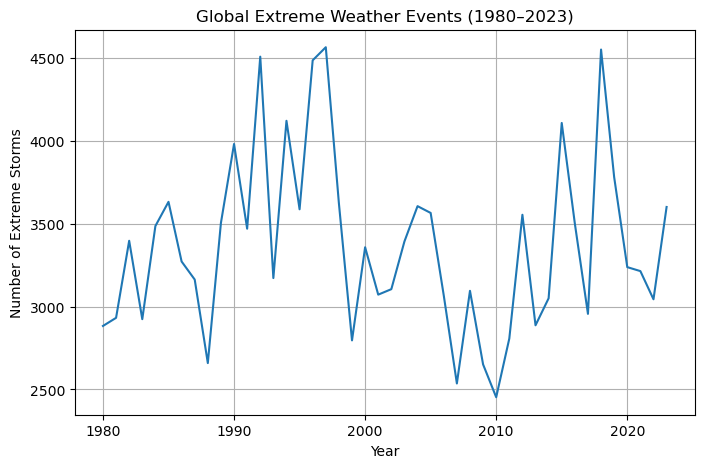

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.plot(events_per_year.index, events_per_year.values)
plt.xlabel("Year")
plt.ylabel("Number of Extreme Storms")
plt.title("Global Extreme Weather Events (1980–2023)")
plt.grid(True)
plt.show()

In [15]:
events_per_year.to_csv("extreme_events_per_year.csv")
extreme_storms.to_csv("extreme_storms_reduced.csv", index=False)

In [16]:
from scipy.stats import linregress

years = events_per_year.index.values
counts = events_per_year.values

slope, intercept, r_value, p_value, std_err = linregress(years, counts)

print("Trend slope:", slope)
print("Correlation (r):", r_value)
print("p-value:", p_value)

Trend slope: -1.3518675123326278
Correlation (r): -0.03241351735733627
p-value: 0.834548129240919


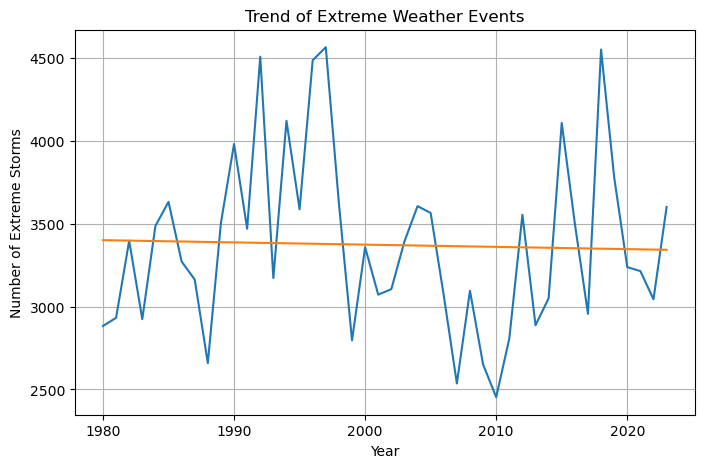

In [17]:
plt.figure(figsize=(8,5))
plt.plot(years, counts)
plt.plot(years, intercept + slope*years)
plt.xlabel("Year")
plt.ylabel("Number of Extreme Storms")
plt.title("Trend of Extreme Weather Events")
plt.grid(True)
plt.savefig("extreme_weather_trend.png", dpi=300)
plt.show()

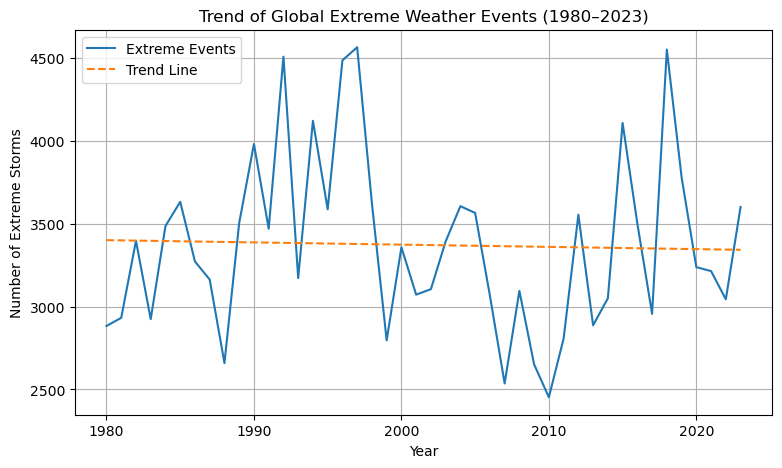

In [18]:
import matplotlib.pyplot as plt
from scipy.stats import linregress

years = events_per_year.index.values
counts = events_per_year.values

slope, intercept, r_value, p_value, std_err = linregress(years, counts)

plt.figure(figsize=(9,5))
plt.plot(years, counts, label="Extreme Events")
plt.plot(years, intercept + slope*years, linestyle='--', label="Trend Line")

plt.xlabel("Year")
plt.ylabel("Number of Extreme Storms")
plt.title("Trend of Global Extreme Weather Events (1980–2023)")
plt.legend()
plt.grid(True)
plt.show()

In [19]:
print(f"Trend slope (events/year): {slope:.3f}")
print(f"Correlation coefficient (r): {r_value:.3f}")
print(f"P-value: {p_value:.5f}")

Trend slope (events/year): -1.352
Correlation coefficient (r): -0.032
P-value: 0.83455


In [20]:
basin_events = extreme_storms.groupby('BASIN').size()
basin_events.sort_values(ascending=False)

BASIN
WP    47231
SI    28275
EP    26615
SP    14157
NI     5435
SA       53
dtype: int64

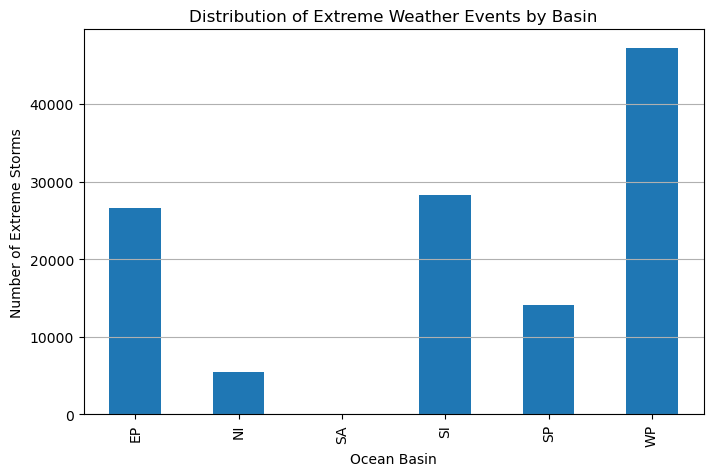

In [21]:
plt.figure(figsize=(8,5))
basin_events.plot(kind='bar')
plt.xlabel("Ocean Basin")
plt.ylabel("Number of Extreme Storms")
plt.title("Distribution of Extreme Weather Events by Basin")
plt.grid(axis='y')
plt.show()

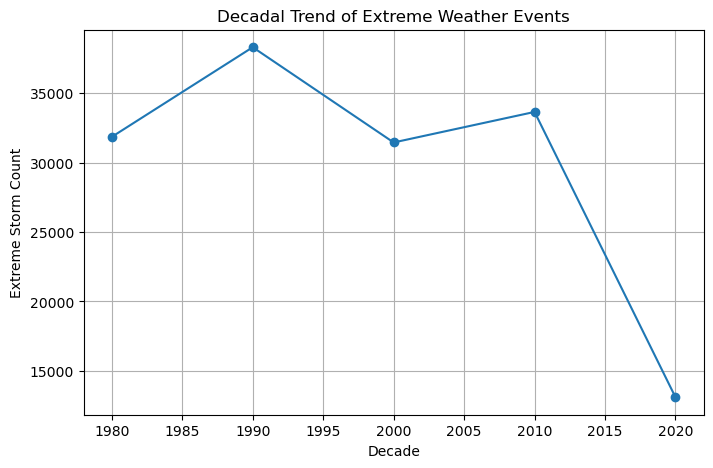

In [47]:
extreme_storms['decade'] = (extreme_storms['year'] // 10) * 10
decadal_counts = extreme_storms.groupby('decade').size()

plt.figure(figsize=(8,5))
plt.plot(decadal_counts.index, decadal_counts.values, marker='o')
plt.xlabel("Decade")
plt.ylabel("Extreme Storm Count")
plt.title("Decadal Trend of Extreme Weather Events")
plt.grid(True)
plt.show()

In [23]:
extreme_storms.isnull().sum()

ISO_TIME        0
USA_WIND        0
LAT             0
LON             0
BASIN       26589
year            0
decade          0
dtype: int64

In [24]:
print("Total storms analyzed:", len(storms))
print("Total extreme storms:", len(extreme_storms))
print("Percentage extreme:",
      round(len(extreme_storms)/len(storms)*100, 2), "%")

Total storms analyzed: 248029
Total extreme storms: 148355
Percentage extreme: 59.81 %


In [1]:
!pip install cartopy shapely

In [5]:
storms = pd.read_csv(
    r"D:\Ruchi\ibtracs.ALL.list.v04r01.csv",
    low_memory=False
)

storms.head()

,SID,SEASON,NUMBER,BASIN,SUBBASIN,NAME,ISO_TIME,NATURE,LAT,LON,...,BOM_GUST_PER,REUNION_GUST,REUNION_GUST_PER,USA_SEAHGT,USA_SEARAD_NE,USA_SEARAD_SE,USA_SEARAD_SW,USA_SEARAD_NW,STORM_SPEED,STORM_DIR
0,,Year,,,,,,,degrees_north,degrees_east,...,second,kts,second,ft,nmile,nmile,nmile,nmile,kts,degrees
1,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 03:00:00,NR,10.9,80.3,...,,,,,,,,,9,265
2,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 06:00:00,NR,10.9,79.8,...,,,,,,,,,9,265
3,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 09:00:00,NR,10.8,79.4,...,,,,,,,,,9,265
4,1842298N11080,1842,1,NI,BB,UNNAMED,1842-10-25 12:00:00,NR,10.8,78.9,...,,,,,,,,,9,265


In [7]:
storms = storms[(storms['year'] >= 1980) & (storms['year'] <= 2023)]
storms.shape

(293577, 175)

In [8]:
storms['USA_WIND'] = pd.to_numeric(storms['USA_WIND'], errors='coerce')

extreme_storms = storms[storms['USA_WIND'] > 33]
extreme_storms.shape

(148355, 175)

In [9]:
extreme_storms[['LAT', 'LON']].head()

,LAT,LON
418065,-16.1,81.7
418066,-16.1,81.3
418067,-16.1,81.0
418090,-12.0,173.5
418091,-12.2,173.7


In [10]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [12]:
extreme_storms['LAT'] = pd.to_numeric(extreme_storms['LAT'], errors='coerce')
extreme_storms['LON'] = pd.to_numeric(extreme_storms['LON'], errors='coerce')
extreme_storms = extreme_storms.copy()
extreme_storms.shape

(148355, 175)

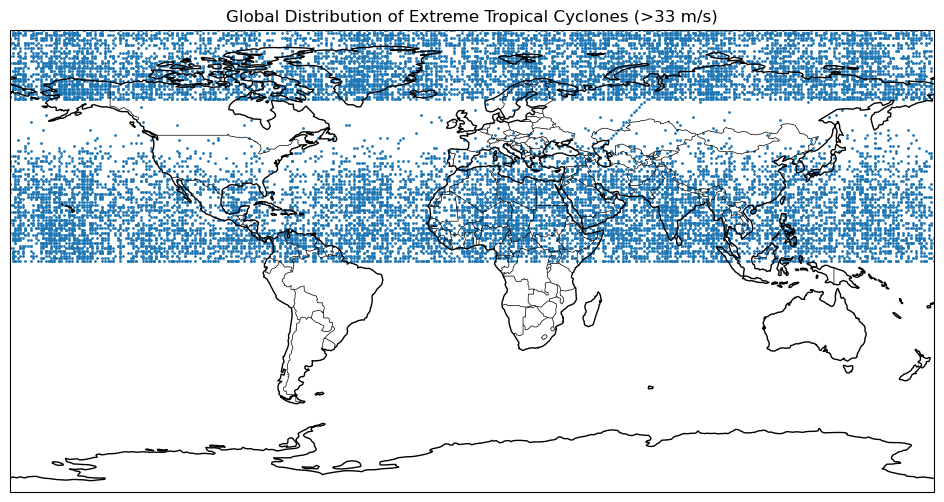

In [48]:
plt.figure(figsize=(12,6))

ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

ax.scatter(
    extreme_storms['LON'],
    extreme_storms['LAT'],
    s=1,
    transform=ccrs.PlateCarree()
)

plt.title("Global Distribution of Extreme Tropical Cyclones (>33 m/s)")
plt.show()


In [14]:
events_per_year = extreme_storms.groupby('year').size()
events_per_year.head()

year
1980.0    2883
1981.0    2932
1982.0    3397
1983.0    2924
1984.0    3486
dtype: int64

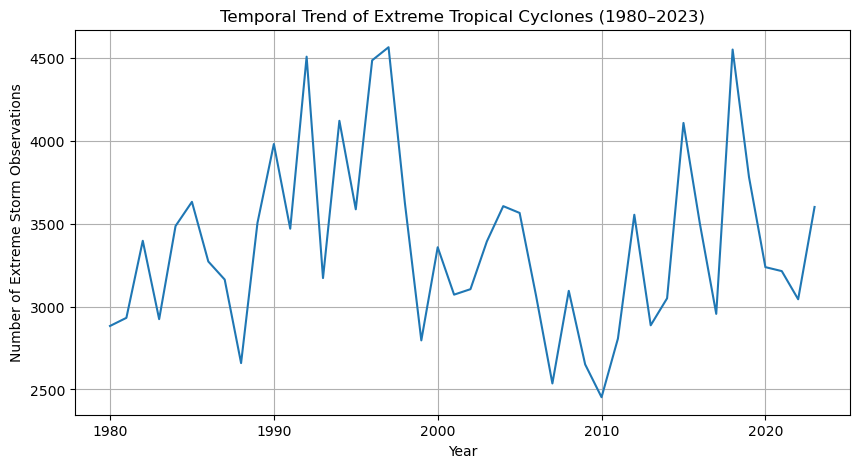

In [15]:
plt.figure(figsize=(10,5))

plt.plot(events_per_year.index, events_per_year.values)

plt.xlabel("Year")
plt.ylabel("Number of Extreme Storm Observations")
plt.title("Temporal Trend of Extreme Tropical Cyclones (1980–2023)")
plt.grid(True)

plt.show()

In [16]:
basin_counts = extreme_storms['BASIN'].value_counts()

basin_counts

BASIN
WP    47231
SI    28275
EP    26615
SP    14157
NI     5435
SA       53
Name: count, dtype: int64

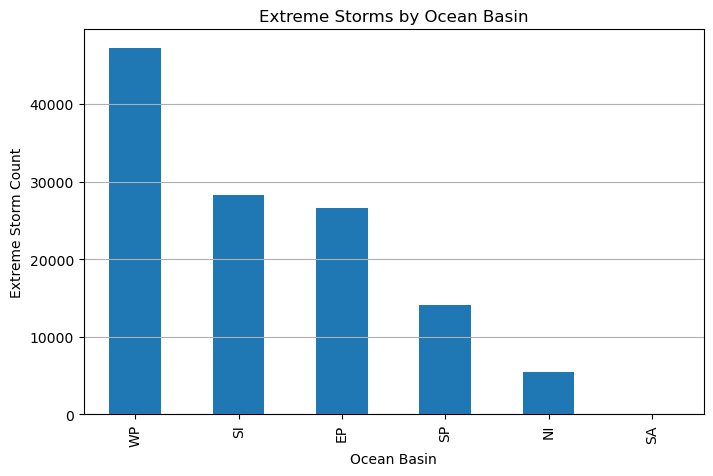

In [17]:
plt.figure(figsize=(8,5))
basin_counts.plot(kind='bar')

plt.xlabel("Ocean Basin")
plt.ylabel("Extreme Storm Count")
plt.title("Extreme Storms by Ocean Basin")
plt.grid(axis='y')

plt.show()

In [18]:
from matplotlib.animation import FuncAnimation

In [21]:
years = sorted(extreme_storms['year'].unique())
len(years), years[:5], years[-5:]

(44,
 [np.float64(1980.0),
  np.float64(1981.0),
  np.float64(1982.0),
  np.float64(1983.0),
  np.float64(1984.0)],
 [np.float64(2019.0),
  np.float64(2020.0),
  np.float64(2021.0),
  np.float64(2022.0),
  np.float64(2023.0)])

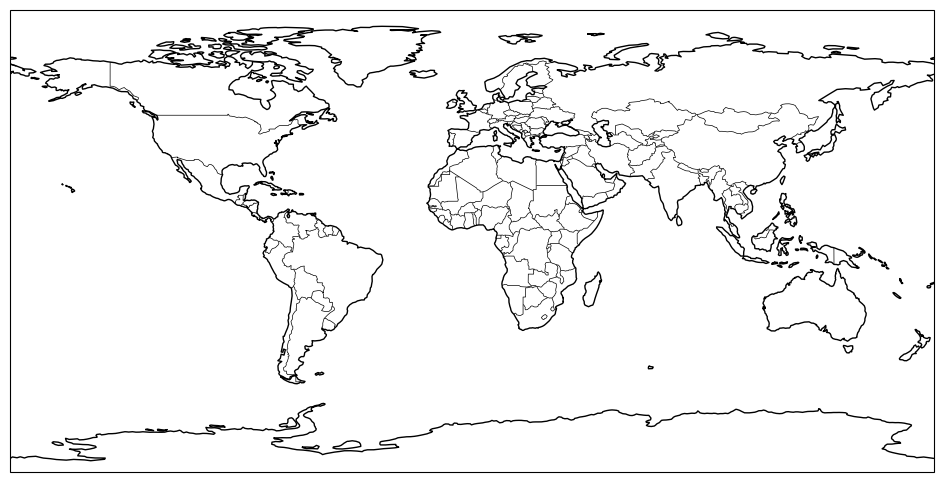

In [22]:
fig = plt.figure(figsize=(12,6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

scat = ax.scatter([], [], s=2, transform=ccrs.PlateCarree())

In [23]:
def update(year):
    data = extreme_storms[extreme_storms['year'] == year]
    scat.set_offsets(data[['LON', 'LAT']].values)
    ax.set_title(f"Extreme Tropical Cyclones (>33 m/s) in {year}")
    return scat,

In [24]:
ani = FuncAnimation(
    fig,
    update,
    frames=years,
    interval=300
)
plt.show()

In [25]:
from IPython.display import HTML
HTML(ani.to_jshtml())

In [29]:
extreme_storms[['USA_WIND', 'LAT', 'LON']].describe()

,USA_WIND,LAT,LON
count,148355.000000,148355.000000,148355.000000
mean,63.054039,10.181097,42.108497
std,26.221530,19.331858,108.638208
min,34.000000,-50.000000,-179.800000
25%,43.000000,-12.200000,-68.300000
50%,55.000000,15.900000,84.900000
75%,78.000000,22.300000,132.400000
max,185.000000,69.000000,260.600000


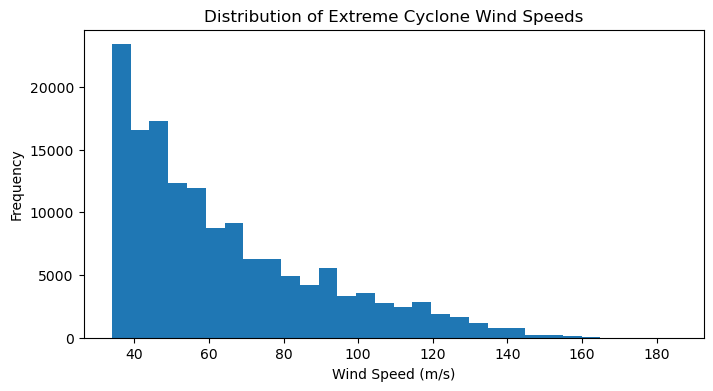

In [30]:
plt.figure(figsize=(8,4))
plt.hist(extreme_storms['USA_WIND'], bins=30)
plt.xlabel("Wind Speed (m/s)")
plt.ylabel("Frequency")
plt.title("Distribution of Extreme Cyclone Wind Speeds")
plt.show()

In [31]:
events_per_year = extreme_storms.groupby('year').size()

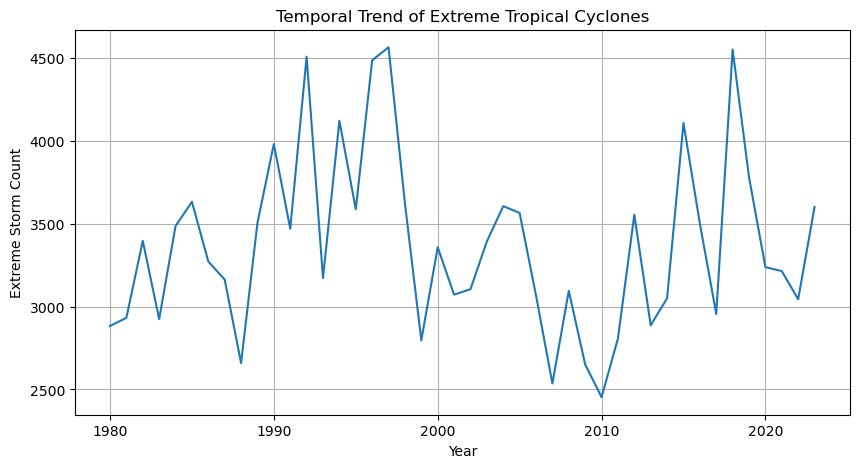

In [32]:
plt.figure(figsize=(10,5))
plt.plot(events_per_year.index, events_per_year.values)
plt.xlabel("Year")
plt.ylabel("Extreme Storm Count")
plt.title("Temporal Trend of Extreme Tropical Cyclones")
plt.grid(True)
plt.show()

In [33]:
from scipy.stats import linregress

slope, intercept, r, p, stderr = linregress(
    events_per_year.index,
    events_per_year.values
)

slope, p

(np.float64(-1.3518675123326278), np.float64(0.834548129240919))

In [34]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [35]:
features = extreme_storms[['LAT', 'LON', 'USA_WIND']].sample(5000, random_state=42)

In [36]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

In [37]:
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

features['cluster'] = clusters

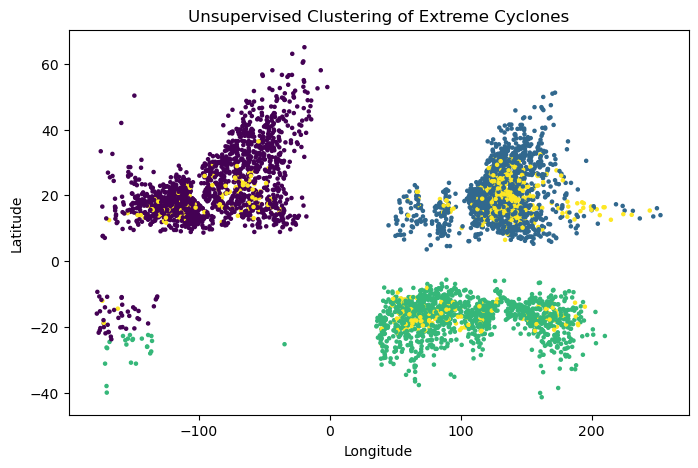

In [38]:
plt.figure(figsize=(8,5))
plt.scatter(features['LON'], features['LAT'], c=features['cluster'], s=5)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Unsupervised Clustering of Extreme Cyclones")
plt.show()

In [39]:
sunspots = pd.DataFrame({
    "year": list(range(1980, 2024)),
    "sunspots": [
        155,141,116,66,45,18,13,29,100,158,
        142,146,94,55,31,18,8,21,64,93,
        120,111,104,63,40,30,15,7,3,4,
        17,55,57,63,79,69,39,21,11,6,
        8,30,47,65
    ]
})

sunspots.head()

,year,sunspots
0,1980,155
1,1981,141
2,1982,116
3,1983,66
4,1984,45


In [40]:
combined = pd.merge(
    events_per_year.reset_index(name="cyclones"),
    sunspots,
    on="year",
    how="inner"
)

combined.head()

,year,cyclones,sunspots
0,1980.0,2883,155
1,1981.0,2932,141
2,1982.0,3397,116
3,1983.0,2924,66
4,1984.0,3486,45


In [41]:
from scipy.stats import pearsonr

corr, pval = pearsonr(combined['cyclones'], combined['sunspots'])
corr, pval

(np.float64(-0.08246370635033523), np.float64(0.5946131961918408))

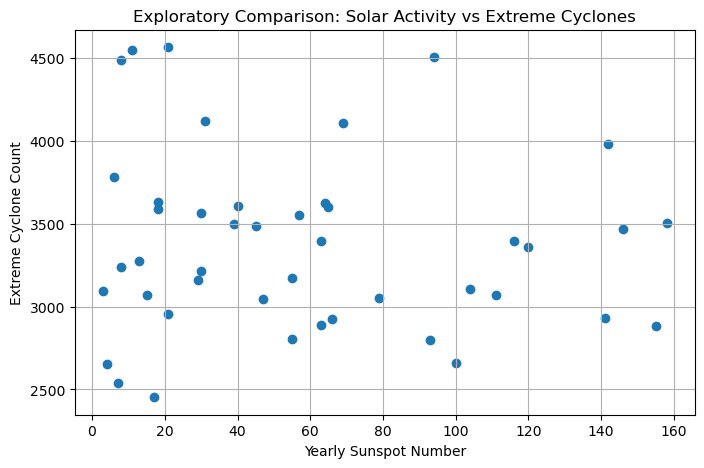

In [42]:
plt.figure(figsize=(8,5))
plt.scatter(combined['sunspots'], combined['cyclones'])
plt.xlabel("Yearly Sunspot Number")
plt.ylabel("Extreme Cyclone Count")
plt.title("Exploratory Comparison: Solar Activity vs Extreme Cyclones")
plt.grid(True)
plt.show()

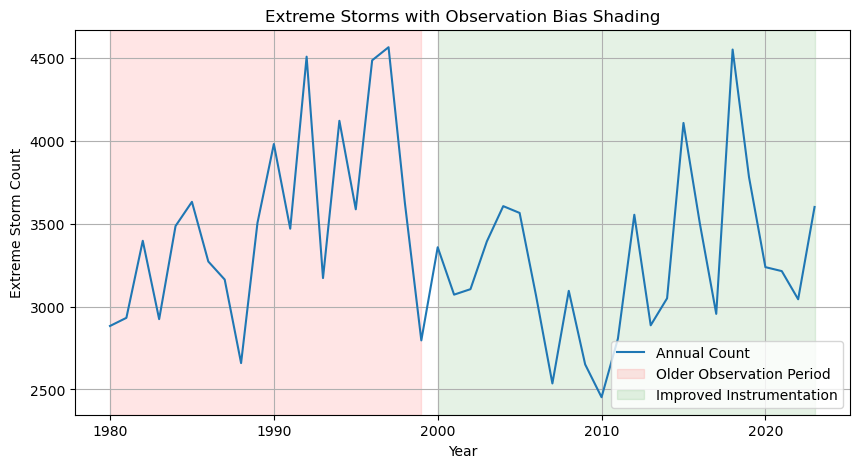

In [45]:
plt.figure(figsize=(10,5))
plt.plot(events_per_year.index, events_per_year.values, label="Annual Count")
plt.axvspan(1980, 1999, color='red', alpha=0.1, label="Older Observation Period")
plt.axvspan(2000, 2023, color='green', alpha=0.1, label="Improved Instrumentation")
plt.xlabel("Year")
plt.ylabel("Extreme Storm Count")
plt.title("Extreme Storms with Observation Bias Shading")
plt.legend()
plt.grid(True)
plt.show()